
════════════════════════════════════════════════════════════
  ФУНКЦИЯ: Розенброк
════════════════════════════════════════════════════════════

▶ Метод Ньютона (классический)
  Стартовая точка      : [0.8, 0.5]
  Найденный минимум    : [1.0, 1.0]
  Значение f в минимуме: 0.0
  Точек в релакс. посл.: 6
  Итераций             : 6

▶ Метод Ньютона (модифицированный)
  Стартовая точка      : [0.8, 0.5]
  Найденный минимум    : [1.0, 0.999999]
  Значение f в минимуме: 0.0
  Точек в релакс. посл.: 564
  Итераций             : 564
════════════════════════════════════════════════════════════

════════════════════════════════════════════════════════════
  ФУНКЦИЯ: Растригин
════════════════════════════════════════════════════════════

▶ Метод Ньютона (классический)
  Стартовая точка      : [0.1, 0.1]
  Найденный минимум    : [-0.0, -0.0]
  Значение f в минимуме: 0.0
  Точек в релакс. посл.: 4
  Итераций             : 4

▶ Метод Ньютона (модифицированный)
  Стартовая точка      : [0.1, 0.1]
  Н

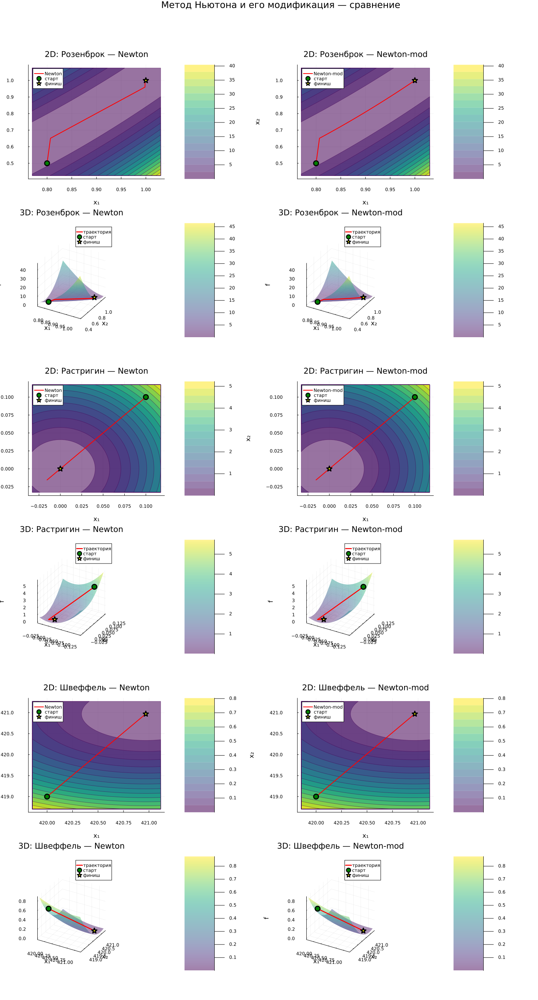

In [6]:
using LinearAlgebra
using Plots
gr()


f_rosen(x; a=1.0, b=100.0) = (a - x[1])^2 + b*(x[2] - x[1]^2)^2

f_rast(x; A=10.0) = 2A + (x[1]^2 - A*cos(2π*x[1])) + (x[2]^2 - A*cos(2π*x[2]))

f_schwef(x) = 418.9829*2 - (x[1]*sin(sqrt(abs(x[1]))) + x[2]*sin(sqrt(abs(x[2]))))


function numgrad(f, x; h=1e-6)
    n  = length(x)
    xv = collect(Float64, x)
    g  = zeros(Float64, n)
    for i in 1:n
        ei   = zeros(Float64, n); ei[i] = 1.0
        g[i] = (f(xv .+ h .* ei) - f(xv .- h .* ei)) / (2h)
    end
    return g
end

function hessian(f, x; h=1e-4)
    n  = length(x)
    xv = collect(Float64, x)
    fx = f(xv)
    H  = zeros(Float64, n, n)
    for i in 1:n
        xp = copy(xv); xm = copy(xv)
        xp[i] += h;    xm[i] -= h
        H[i,i] = (f(xp) - 2fx + f(xm)) / h^2
    end
    for i in 1:n, j in (i+1):n
        xpp = copy(xv); xpm = copy(xv); xmp = copy(xv); xmm = copy(xv)
        xpp[i] += h; xpp[j] += h
        xpm[i] += h; xpm[j] -= h
        xmp[i] -= h; xmp[j] += h
        xmm[i] -= h; xmm[j] -= h
        v = (f(xpp) - f(xpm) - f(xmp) + f(xmm)) / (4h^2)
        H[i,j] = v; H[j,i] = v
    end
    return H
end


function newton(f, x0; eps=1e-6, maxit=1000)
    xk    = collect(Float64, x0)
    hist  = [copy(xk)]
    iters = 0
    for k in 1:maxit
        iters = k
        grad  = numgrad(f, xk)
        norm(grad) < eps && break
        xk = xk .- inv(hessian(f, xk)) * grad
        push!(hist, copy(xk))
    end
    return hist[end], hist, iters
end

function newton_mod(f, x0; eps=1e-6, maxit=1000, c=1e-4)
    xk    = collect(Float64, x0)
    hist  = [copy(xk)]
    H_inv = inv(hessian(f, xk))
    iters = 0
    for k in 1:maxit
        iters = k
        grad  = numgrad(f, xk)
        norm(grad) < eps && break
        p  = H_inv * grad
        fx = f(xk)
        α  = 1.0
        for _ in 1:20
            f(xk .- α .* p) <= fx - c * α * dot(grad, p) && break
            α *= 0.5
        end
        xk = xk .- α .* p
        push!(hist, copy(xk))
    end
    return hist[end], hist, iters
end


function get_xy(hist)
    return [p[1] for p in hist], [p[2] for p in hist]
end

function hist_bounds(hist; pad=0.15)
    xs, ys = get_xy(hist)
    xmin, xmax = minimum(xs), maximum(xs)
    ymin, ymax = minimum(ys), maximum(ys)
    dx = max(xmax - xmin, 1e-2); dy = max(ymax - ymin, 1e-2)
    return xmin - pad*dx, xmax + pad*dx, ymin - pad*dy, ymax + pad*dy
end

function plot2d_single(f, hist, fname, method; gridN=200)
    xmin, xmax, ymin, ymax = hist_bounds(hist)
    xg = range(xmin, xmax; length=gridN)
    yg = range(ymin, ymax; length=gridN)
    Z  = [f([x, y]) for y in yg, x in xg]

    xs, ys = get_xy(hist)
    p = contourf(xg, yg, Z;
                 color=:viridis, alpha=0.55,
                 xlabel="x₁", ylabel="x₂",
                 title="2D: $fname — $method")

    plot!(p,    xs,      ys;          lw=2, color=:red,    label=method)
    scatter!(p, [xs[1]],   [ys[1]];  ms=7, color=:green,  label="старт",  markershape=:circle)
    scatter!(p, [xs[end]], [ys[end]]; ms=7, color=:yellow, label="финиш", markershape=:star5)
    return p
end

function plot3d_single(f, hist, fname, method; gridN=80)
    xs, ys = get_xy(hist)
    fvals  = [f([x, y]) for (x, y) in zip(xs, ys)]

    xmin, xmax, ymin, ymax = hist_bounds(hist; pad=0.2)
    xg = range(xmin, xmax; length=gridN)
    yg = range(ymin, ymax; length=gridN)
    Z  = [f([x, y]) for y in yg, x in xg]

    p = surface(xg, yg, Z;
                alpha=0.5, color=:viridis,
                xlabel="x₁", ylabel="x₂", zlabel="f",
                title="3D: $fname — $method",
                legend=:topright)

    plot!(p,    xs,      ys,      fvals;         lw=2.5, color=:red,    label="траектория")
    scatter!(p, [xs[1]],   [ys[1]],   [fvals[1]];   ms=7, color=:green,  label="старт", markershape=:circle)
    scatter!(p, [xs[end]], [ys[end]], [fvals[end]]; ms=7, color=:yellow, label="финиш", markershape=:star5)
    return p
end


function print_summary(fname, x0, res_n, res_mod, f)
    xmin_n, hist_n, it_n = res_n
    xmin_m, hist_m, it_m = res_mod

    println("\n" * "═"^60)
    println("  ФУНКЦИЯ: $fname")
    println("═"^60)

    for (label, xmin, hist, it) in [
        ("Ньютона (классический)",             xmin_n, hist_n, it_n),
        ("Ньютона (модифицированный)", xmin_m, hist_m, it_m),
    ]
        println("\n▶ Метод $label")
        println("  Стартовая точка      : $(round.(x0,     digits=4))")
        println("  Найденный минимум    : $(round.(xmin,   digits=6))")
        println("  Значение f в минимуме: $(round(f(xmin), digits=8))")
        println("  Точек в релакс. посл.: $(length(hist))")
        println("  Итераций             : $it")
    end
    println("═"^60)
end


tests = [
    (f_rosen,  "Розенброк", [0.8,  0.5  ]),
    (f_rast,   "Растригин", [0.1,  0.1  ]),
    (f_schwef, "Швеффель",  [420.0, 419.0]),
]

all_plots = Plots.Plot[]

for (f, fname, x0) in tests
    res_n   = newton(f, x0)
    res_mod = newton_mod(f, x0)

    _, hist_n,   _ = res_n
    _, hist_mod, _ = res_mod

    print_summary(fname, x0, res_n, res_mod, f)

    push!(all_plots, plot2d_single(f, hist_n,   fname, "Newton"))
    push!(all_plots, plot2d_single(f, hist_mod, fname, "Newton-mod"))
    push!(all_plots, plot3d_single(f, hist_n,   fname, "Newton"))
    push!(all_plots, plot3d_single(f, hist_mod, fname, "Newton-mod"))
end

display(plot(all_plots...; layout=(6, 2), size=(1400, 2600),
             plot_title="Метод Ньютона и его модификация — сравнение"))